In [ ]:
# Kevin Richard
# Birds Classification

In [1]:
import sys
!{sys.executable} -m pip install opencv-python
import cv2
import numpy as np

import os
from IPython.display import display, Image

import tensorflow as tf
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.preprocessing.image import ImageDataGenerator

import random



[notice] A new release of pip is available: 23.2.1 -> 23.3.1
[notice] To update, run: C:\Users\kev70\AppData\Local\Programs\Python\Python311\python.exe -m pip install --upgrade pip


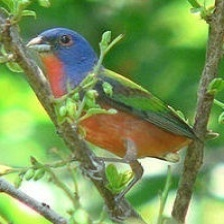

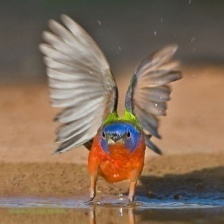

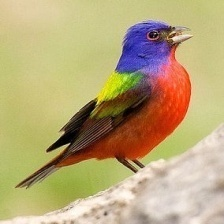

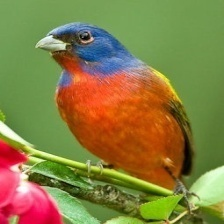

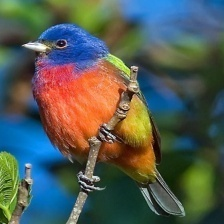

...

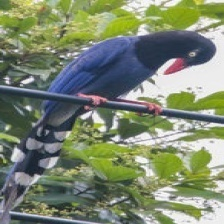

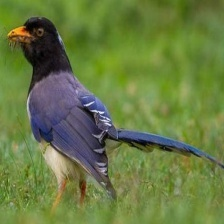

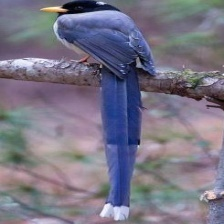

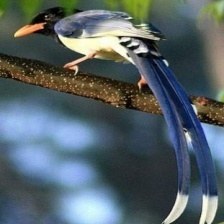

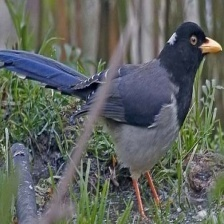

In [2]:
# Local Training and Validation files provided by the professor

Train_Folder ='/Bird/Testing'
Validation_Folder ='/Bird/Validation'
birds = os.listdir(Train_Folder)
val_birds = os.listdir(Validation_Folder)

# Displaying all the input pictures of the birds

image_list = []
for bird in birds:
    path = os.path.join(Train_Folder, bird)
    image_files = [f for f in os.listdir(path) if f.lower().endswith(('.png', '.jpg', '.jpeg', '.gif'))]
    for image_file in image_files:
        image_path = os.path.join(path, image_file)
        image_list.append([Image(filename=image_path), bird])
        display(Image(filename=image_path))


In [3]:
# Example of Label taken from filename

display(image_list[1][1])

'PAINTED BUNTIG'

In [4]:
# Training pictures converted to cv2 format and resized to 256x256

Train_list = []
for bird in birds:
    path = os.path.join(Train_Folder, bird)
    for image_file in os.listdir(path):
        image_path = os.path.join(path, image_file)
        img = cv2.imread(image_path)
        resized_image = cv2.resize(img, (256, 256))
        Train_list.append([resized_image, bird])


In [5]:
# Validation pictures converted to cv2 format and resized to 256x256

Validation_list = []
for bird in val_birds:
    path = os.path.join(Validation_Folder, bird)
    for image_file in os.listdir(path):
        image_path = os.path.join(path, image_file)
        img = cv2.imread(image_path)
        resized_image = cv2.resize(img, (256, 256))
        Validation_list.append([resized_image, bird])

In [9]:
# Normalizing training data and seperating label

X =[]
y=[]
for row in Train_list:
    X.append(row[0]/255.0)
    y.append(row[1])

# Normalizing testing data and seperating label

X_t = []
y_t = []
for row in Validation_list:
    X_t.append(row[0]/255.0)
    y_t.append(row[1])

In [10]:
# converting training and testing data into numpy arrays for fitting to model.

X = np.array(X)
X_train = X.reshape(-1, 256, 256, 3)
y_train = np.array(y)

X_t = np.array(X_t)
X_test = X_t.reshape(-1, 256, 256, 3)
y_test = np.array(y_t)

In [11]:
# Fiting the encoder of my string labels and transforming them into integer labels
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)
y_test_encoded = label_encoder.transform(y_test)

In [12]:
print(y_train_encoded)
class_to_string_mapping = {label: string for label, string in enumerate(label_encoder.classes_)}

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 3 3 3
 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3]


In [13]:
# initializing Sequential model
model = tf.keras.Sequential()

# Taking input of images of shape (256,256,3)
model.add(tf.keras.layers.Conv2D(32, (3,3), 1, activation = 'relu', input_shape=(256,256,3)))
model.add(tf.keras.layers.MaxPooling2D(2,2))

model.add(tf.keras.layers.Conv2D(64, (3,3), 1, activation = 'relu'))
model.add(tf.keras.layers.MaxPooling2D(2,2))

model.add(tf.keras.layers.Conv2D(32, (3,3), 1, activation = 'relu'))
model.add(tf.keras.layers.MaxPooling2D(2,2))

model.add(tf.keras.layers.Flatten())

model.add(tf.keras.layers.Dense(256, activation='relu'))

# Using softmax because we have 4 different labels 
model.add(tf.keras.layers.Dense(4,activation='softmax'))

# it is common to use adam optimizer
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
model.summary()



Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 254, 254, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2  (None, 127, 127, 32)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 125, 125, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 62, 62, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 60, 60, 32)        18464     
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 30, 30, 32)        0

In [14]:
# Taking 20 epochs, ideal epoch before overfitting started. 

batch_size = 32
hist = model.fit(X_train, y_train_encoded,batch_size = batch_size, epochs=20, validation_data=(X_test, y_test_encoded))
test_loss, test_accuracy = model.evaluate(X_test, y_test_encoded, verbose=0)

Epoch 1/20
14/14 [==============================] - 25s 2s/step - loss: 1.3948 - accuracy: 0.4273 - val_loss: 0.9659 - val_accuracy: 0.5875
Epoch 2/20
14/14 [==============================] - 23s 2s/step - loss: 0.6189 - accuracy: 0.7364 - val_loss: 0.4194 - val_accuracy: 0.8000
Epoch 3/20
14/14 [==============================] - 22s 2s/step - loss: 0.2595 - accuracy: 0.9205 - val_loss: 0.5563 - val_accuracy: 0.7500
Epoch 4/20
14/14 [==============================] - 23s 2s/step - loss: 0.2392 - accuracy: 0.9205 - val_loss: 0.3380 - val_accuracy: 0.8750
Epoch 5/20
14/14 [==============================] - 22s 2s/step - loss: 0.1089 - accuracy: 0.9659 - val_loss: 0.4578 - val_accuracy: 0.8000
Epoch 6/20
14/14 [==============================] - 23s 2s/step - loss: 0.0936 - accuracy: 0.9750 - val_loss: 0.2628 - val_accuracy: 0.8875
Epoch 7/20
14/14 [==============================] - 23s 2s/step - loss: 0.0496 - accuracy: 0.9909 - val_loss: 0.4708 - val_accuracy: 0.7875
Epoch 8/20
14/14 [==

In [15]:
predictions = model.predict(X_test)

3/3 [==============================] - 1s 306ms/step


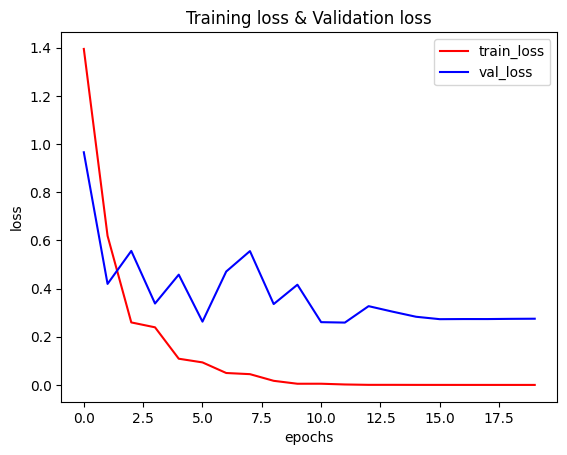

In [16]:
# Training loss & Validation loss plot

plt.plot(hist.history['loss'],color='red',label='train_loss')
plt.plot(hist.history['val_loss'],color='blue',label='val_loss')
plt.title("Training loss & Validation loss")
plt.xlabel("epochs")
plt.ylabel("loss")
plt.legend()
plt.show()

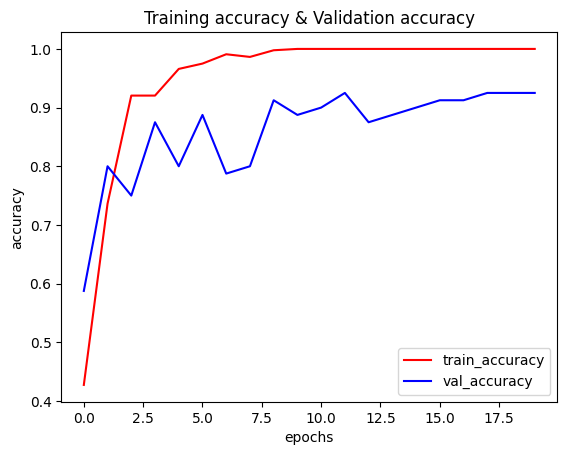

In [17]:
# Training accuracy & Validation accuracy plot
plt.plot(hist.history['accuracy'],color='red',label='train_accuracy')
plt.plot(hist.history['val_accuracy'],color='blue',label='val_accuracy')
plt.legend()
plt.title("Training accuracy & Validation accuracy")
plt.xlabel("epochs")
plt.ylabel("accuracy")
plt.show()


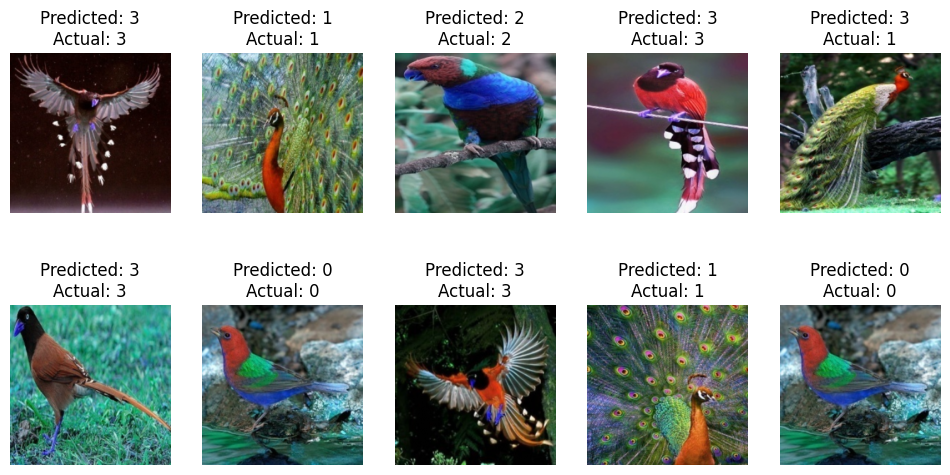

In [18]:
# Output of predictions

plt.figure(figsize=(12, 6))
for i in range(min(len(X_test), 10)):
    plt.subplot(2, 5, i + 1)
    random_value = random.randint(0, len(X_test))
    plt.imshow(X_test[random_value], cmap='gray')
    plt.title(f"Predicted: {tf.argmax(predictions[random_value]).numpy()}\nActual: {y_test_encoded[random_value]}")
    plt.axis('off')
plt.show()